In [1]:
leads = read.csv("/hps/nobackup/stegle/users/acuomo/all_scripts/sc_neuroseq/eqtl/all_leads_5pct_FDR.csv", row.names = 1)
head(leads,2)

snp_id,p_value,beta,beta_se,empirical_feature_p_value,feature_chromosome,feature_start,feature_end,n_samples,n_e_samples,...,snp_chromosome,snp_position,assessed_allele,call_rate,maf,hwe_p,feature_id,global_corr_p_value,label,new_label
21_30373541_T_C,2.920966e-25,-0.8525780,0.08210206,1.632719e-14,21,30376705,30391699,173,173,...,21,30373541,C,1,0.2398844,0.09609073,ENSG00000156253,1.400559e-12,FPP_D11,FPP_D11
21_30432557_G_A,1.495486e-48,0.5058675,0.03454695,1.169470e-31,21,30428126,30446118,173,173,...,21,30432557,A,1,0.1358382,1.00000000,ENSG00000156261,1.059433e-28,FPP_D11,FPP_D11


In [2]:
genes = as.character(leads[leads$new_label == "DA_D52","feature_id"])
genes0 = as.character(leads[leads$new_label == "DA_ROT_D52","feature_id"])
# genes
ROT_genes = genes0[!(genes0 %in% genes)]

In [3]:
length(ROT_genes)

[1] 47

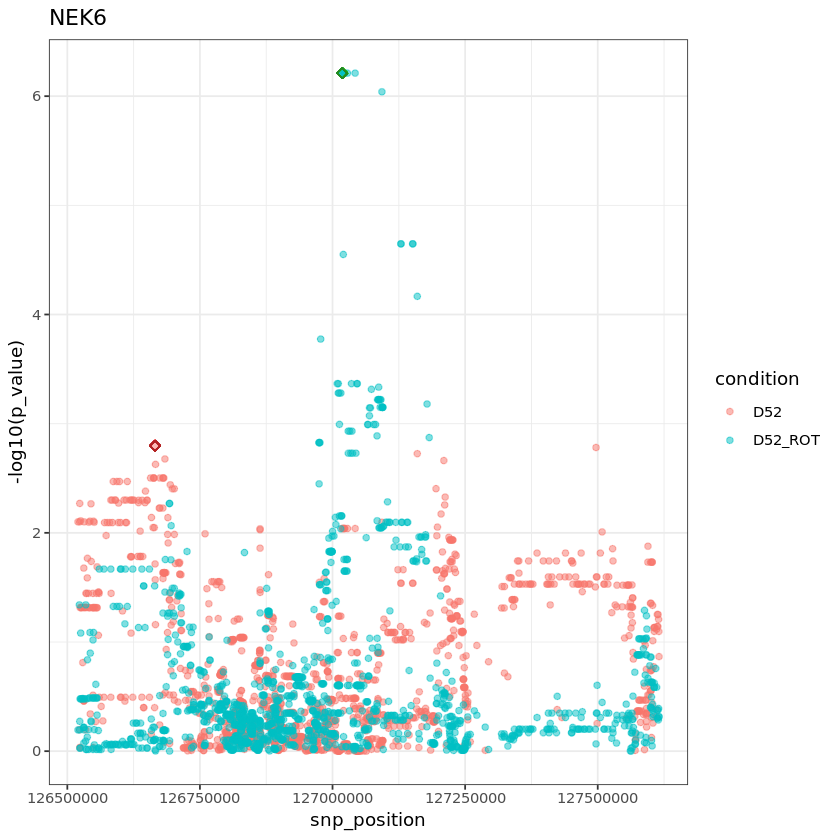

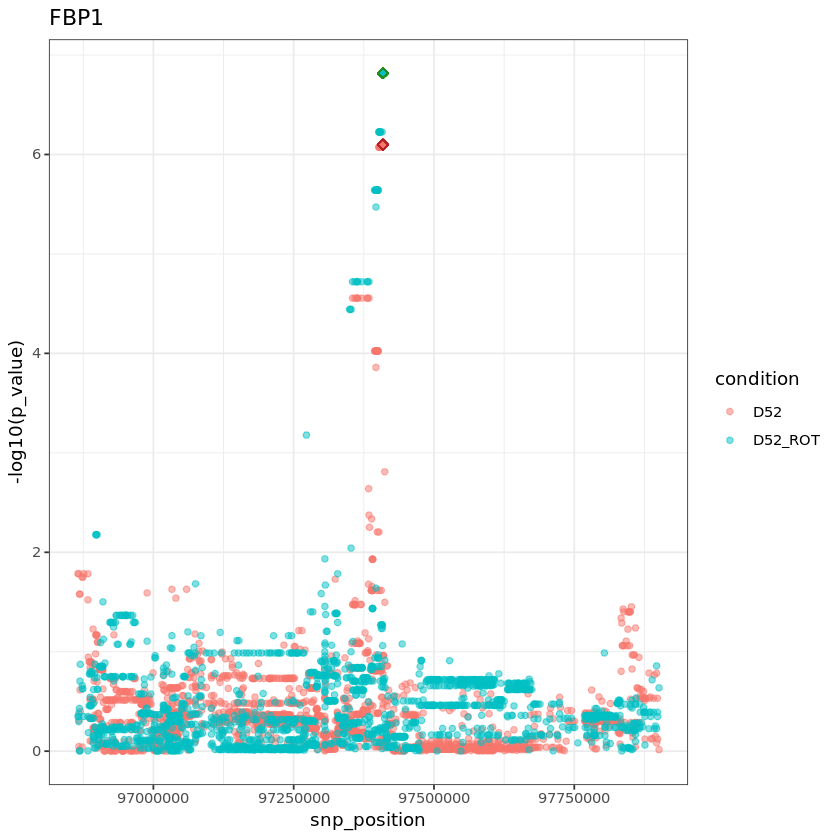

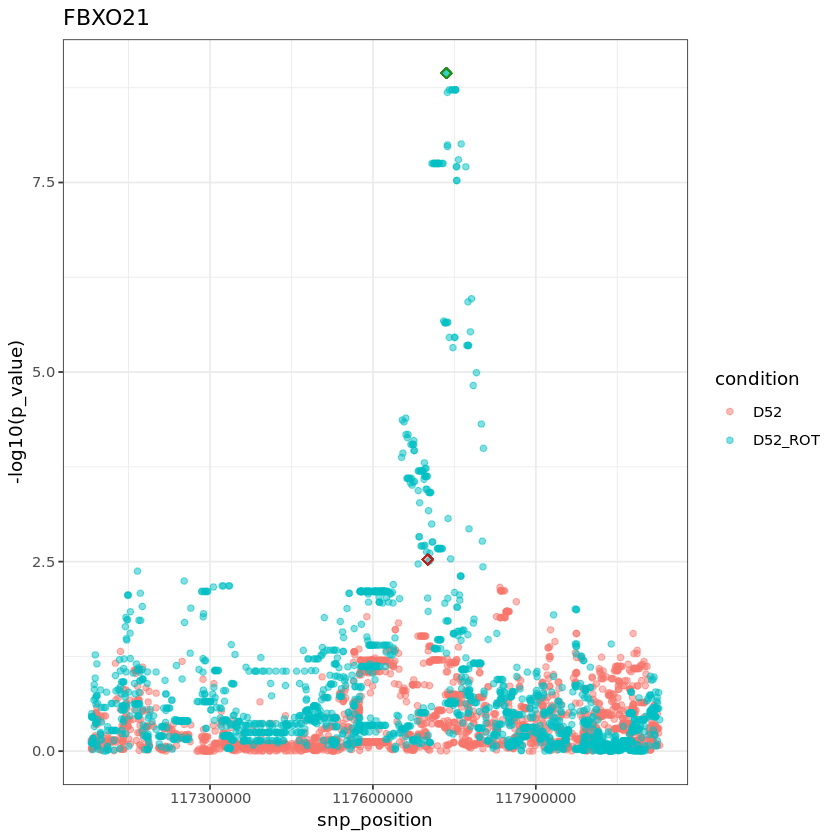

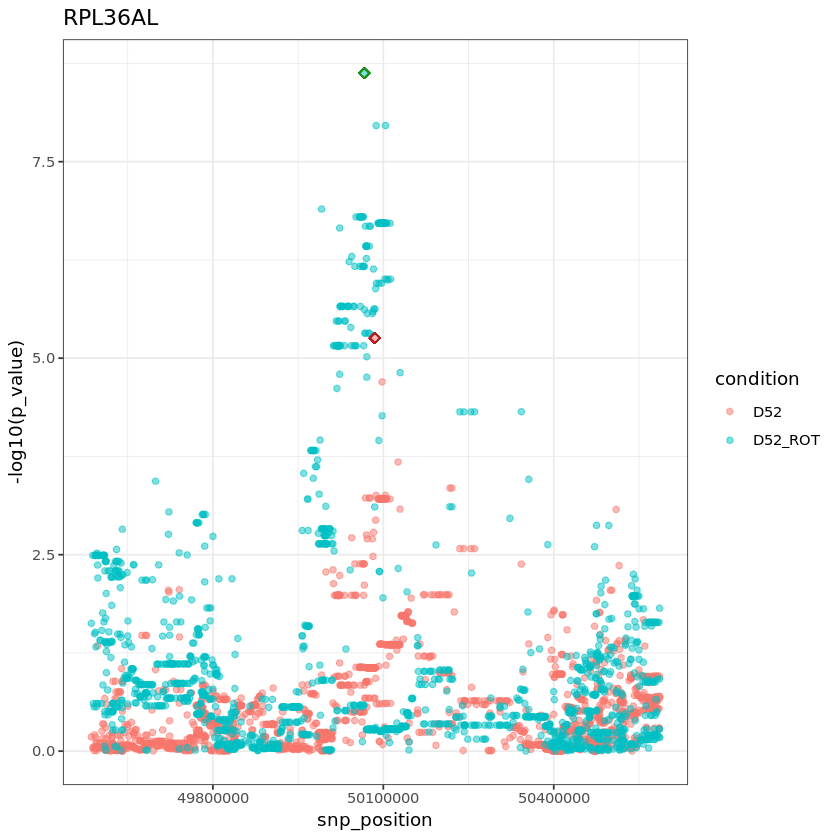

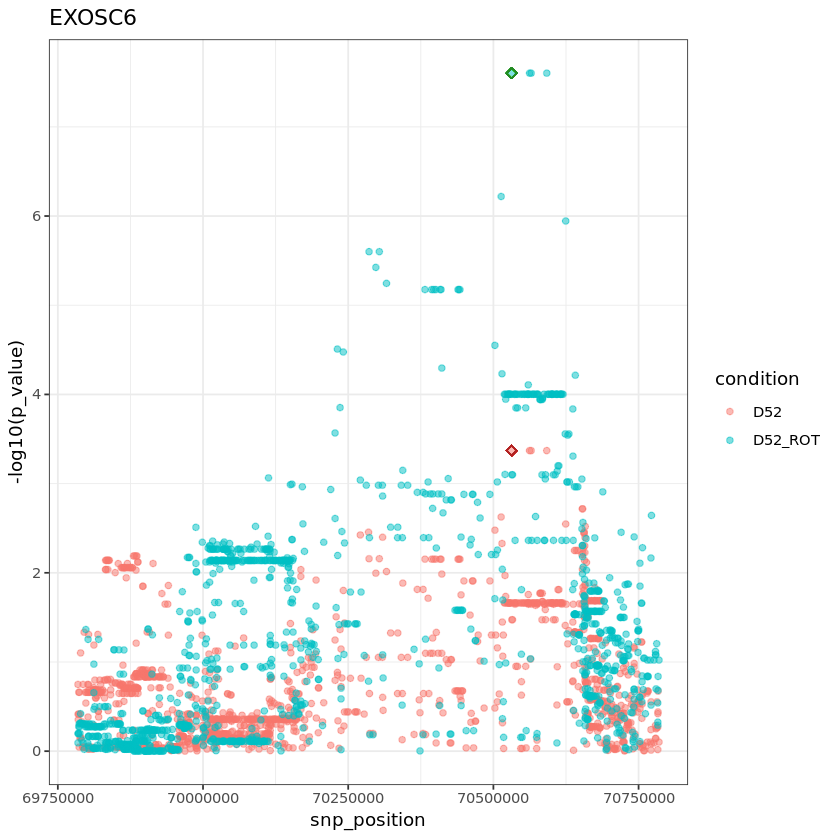

...

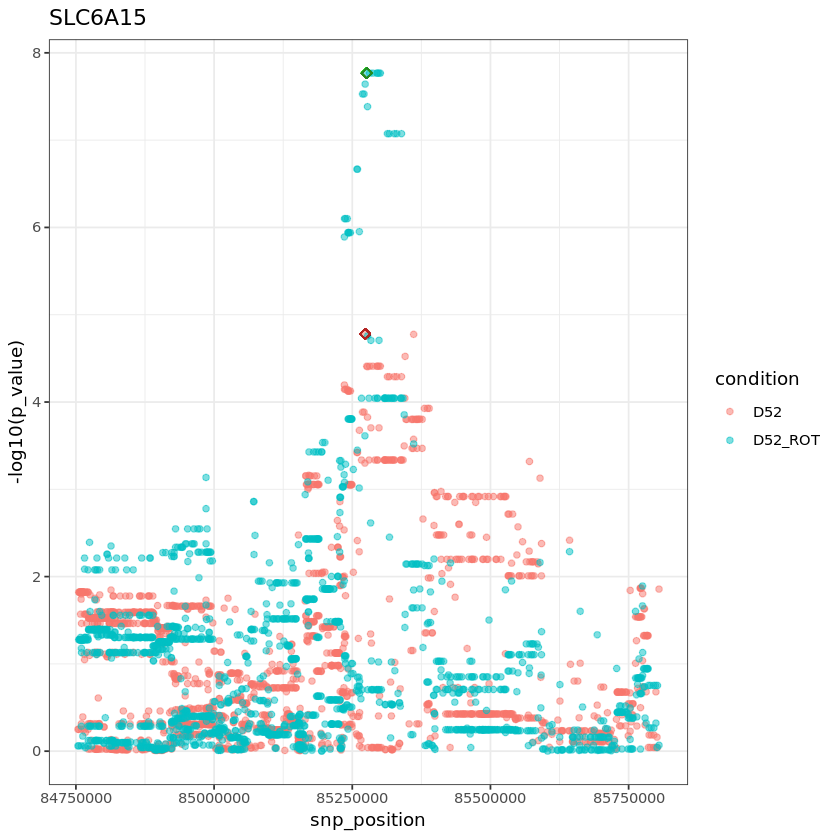

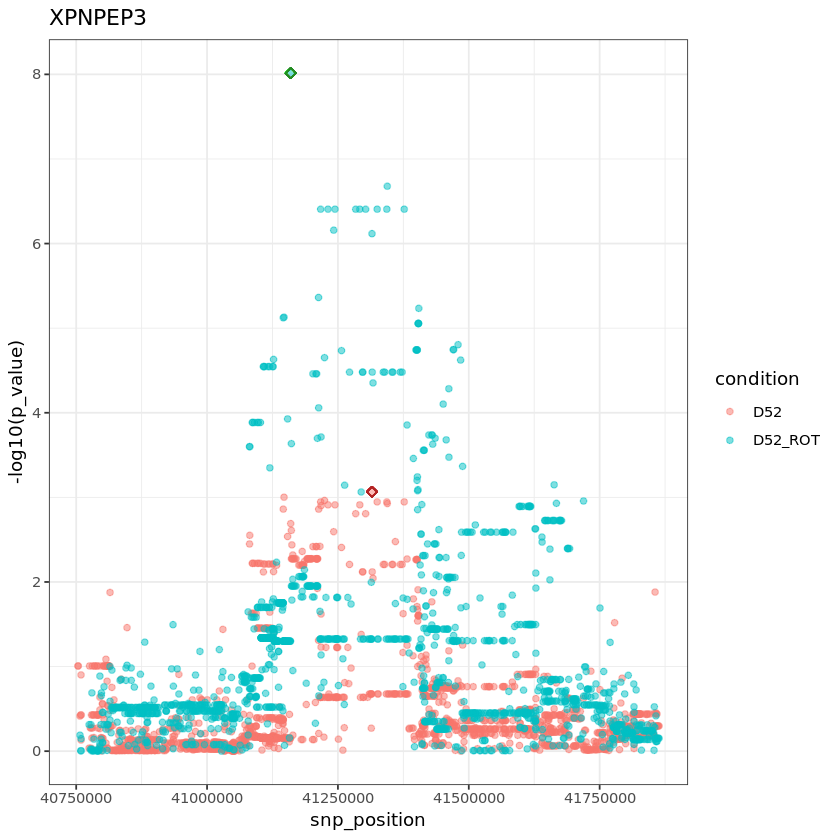

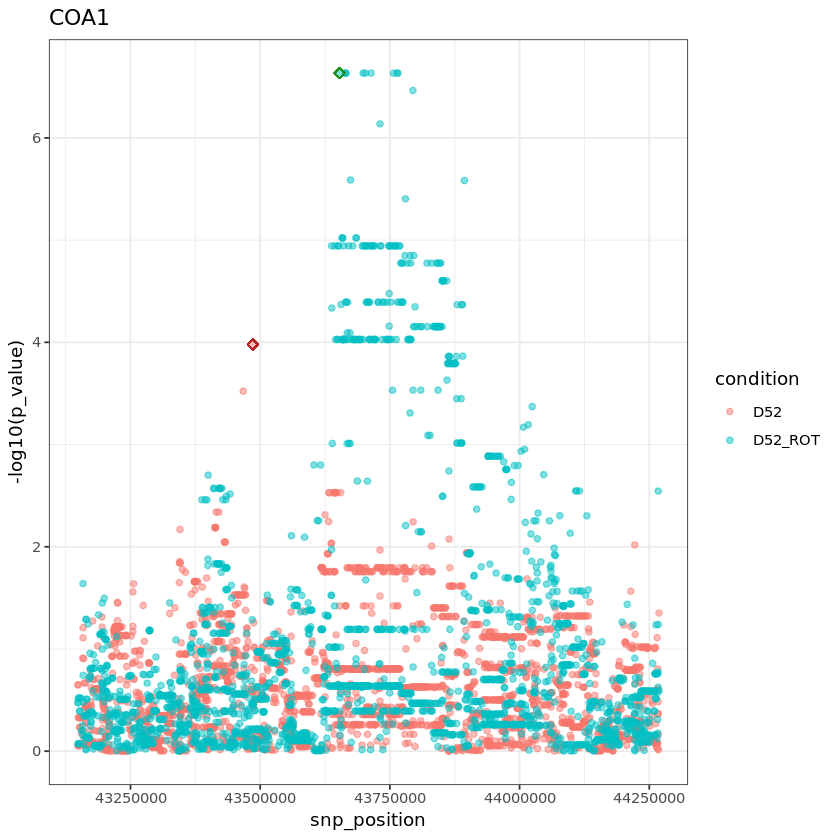

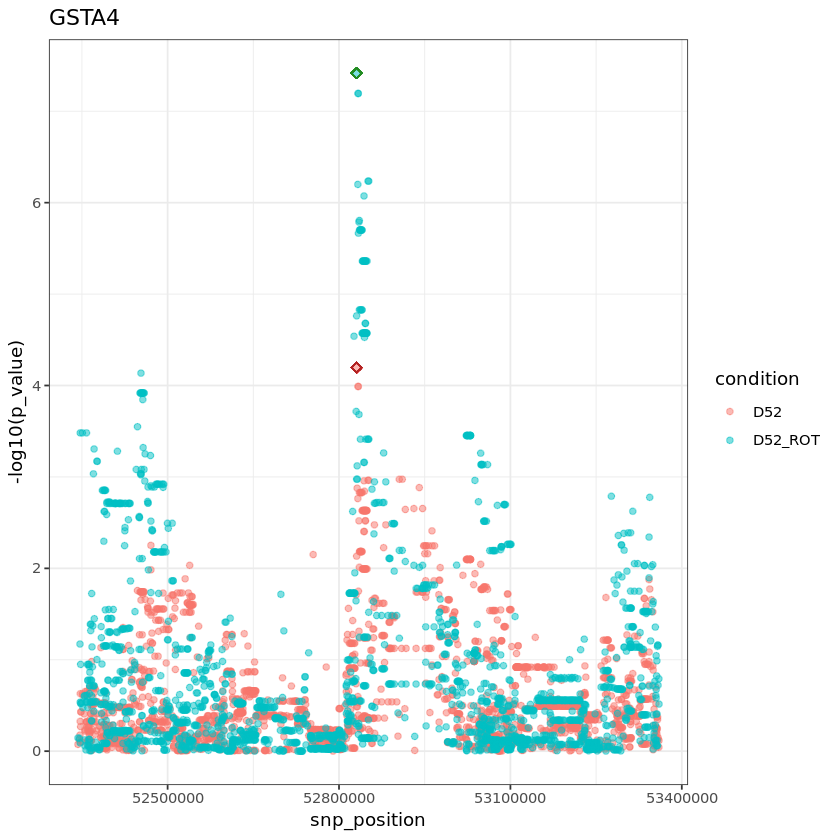

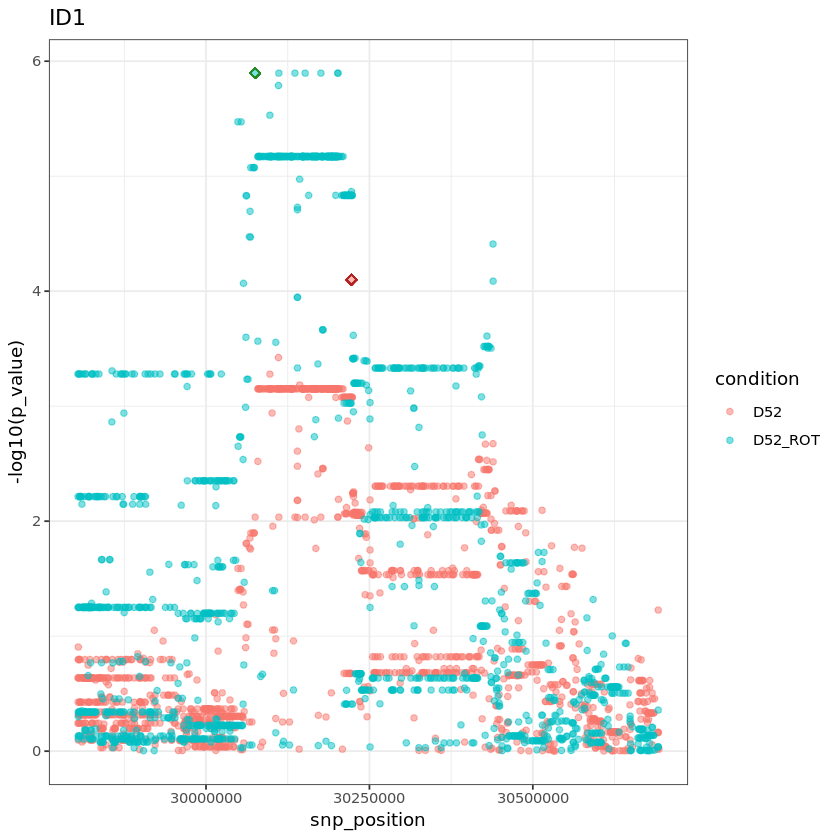

In [20]:
for (gene in ROT_genes){
    gene_name = as.character(annos[annos$ensembl_gene_id == gene,"hgnc_symbol"])
    r1 = res.DA.D52[res.DA.D52$feature_id == gene,]
    r2 = res.DA.D52ROT[res.DA.D52ROT$feature_id == gene,]
    r1$condition = "D52"
    r2$condition = "D52_ROT"
    df = rbind(r1,r2)
    m1 = min(df[df$condition == "D52","p_value"])
    pos1 = df[df$condition == "D52" & df$p_value == m1,"snp_position"][1]
    m2 = min(df[df$condition == "D52_ROT","p_value"])
    pos2 = df[df$condition == "D52_ROT" & df$p_value == m2,"snp_position"][1]
    p = ggplot(df, aes(x = snp_position, y = -log10(p_value), colour = condition))+geom_point(alpha = 0.5)
    p = p + geom_point(aes(x=pos1, y = -log10(m1)),col="firebrick", size = 2, shape = 23, alpha = 1)
    p = p + geom_point(aes(x=pos2, y = -log10(m2)),col="forestgreen", size = 2, shape = 23, alpha = 1)
    p = p + ggtitle(gene_name) 
    p = p + ylim(c(0,-log10(min(df$p_value)))) + theme_bw()
    print(p) 
}

In [8]:
# library(ggplot2)

In [10]:
mydir.D52 = "/hps/nobackup/stegle/users/acuomo/all_scripts/sc_neuroseq/eqtl/timepoint_D52/summary_stats/for_coloc/"
res.DA.D52 = read.csv(paste0(mydir.D52,"qtl_results_NONE_DA_all.txt"),sep="\t")
res.DA.D52ROT = read.csv(paste0(mydir.D52,"qtl_results_ROT_DA_all.txt"),sep="\t")

In [6]:
gene_name = 'ACSF3'

In [1]:
annos_file = "/hps/nobackup/hipsci/scratch/singlecell_endodiff/data_processed/scQTLs/annos/combined_feature_id_annos.tsv"
annos = read.csv(annos_file,sep="\t")
head(annos,2)

feature_id,chromosome,start,end,hgnc_symbol,combined_feature_id,ensembl_gene_id
ENSG00000000003_TSPAN6,X,99883667,99894988,TSPAN6,ENSG00000000003_TSPAN6,ENSG00000000003
ENSG00000000419_DPM1,20,49551404,49575092,DPM1,ENSG00000000419_DPM1,ENSG00000000419


In [3]:
annos[annos$hgnc_symbol == 'SFXN5',]
annos[annos$hgnc_symbol == 'FGFR1',]

,feature_id,chromosome,start,end,hgnc_symbol,combined_feature_id,ensembl_gene_id
5939,ENSG00000144040_SFXN5,2,73169165,73302747,SFXN5,ENSG00000144040_SFXN5,ENSG00000144040


,feature_id,chromosome,start,end,hgnc_symbol,combined_feature_id,ensembl_gene_id
1012,ENSG00000077782_FGFR1,8,38268656,38326352,FGFR1,ENSG00000077782_FGFR1,ENSG00000077782


In [9]:
gene = as.character(annos[annos$hgnc_symbol == gene_name,"ensembl_gene_id"])
r1 = res.DA.D52[res.DA.D52$feature_id == gene,]
r2 = res.DA.D52ROT[res.DA.D52ROT$feature_id == gene,]

ERROR: Error in eval(expr, envir, enclos): object 'res.DA.D52ROT' not found


In [4]:
# m1 = min(r1$p_value)
# pos1 = r1[r1$p_value == m1,"snp_position"][1]
# ggplot(r1, aes(x = snp_position, y = -log10(p_value))) + geom_point(alpha = 0.5) + 
#     geom_point(aes(x=pos1, y = -log10(m1)),col="firebrick", size = 2, shape = 23, alpha = 1) + 
#     ggtitle(gene_name) + ylim(c(0,-log10(m1))) + theme_bw()

In [5]:
# m2 = min(r2$p_value)
# pos2 = r2[r2$p_value == m2,"snp_position"][1]
# ggplot(r2, aes(x = snp_position, y = -log10(p_value))) + geom_point(alpha = 0.5) + 
#     geom_point(aes(x=pos2, y = -log10(m2)),col="firebrick", size = 2, shape = 23, alpha = 1) + 
#     ggtitle(gene_name) + ylim(c(0,-log10(m2))) + theme_bw()

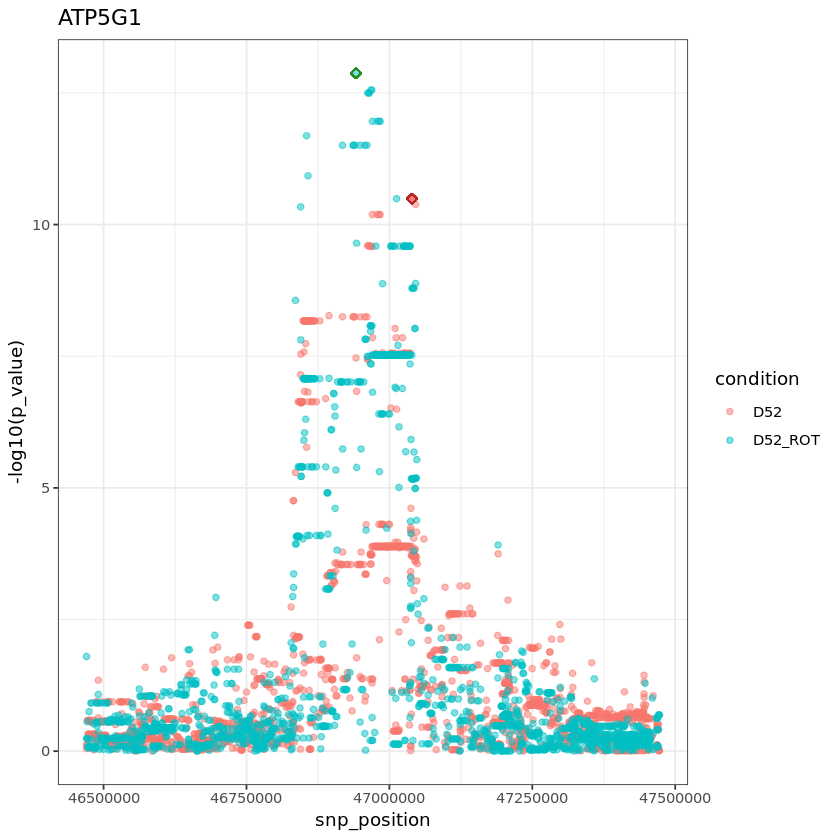

In [10]:
r1$condition = "D52"
r2$condition = "D52_ROT"
df = rbind(r1,r2)
m1 = min(df[df$condition == "D52","p_value"])
pos1 = df[df$condition == "D52" & df$p_value == m1,"snp_position"][1]
m2 = min(df[df$condition == "D52_ROT","p_value"])
pos2 = df[df$condition == "D52_ROT" & df$p_value == m2,"snp_position"][1]
p = ggplot(df, aes(x = snp_position, y = -log10(p_value), colour = condition))+geom_point(alpha = 0.5)
p = p + geom_point(aes(x=pos1, y = -log10(m1)),col="firebrick", size = 2, shape = 23, alpha = 1)
p = p + geom_point(aes(x=pos2, y = -log10(m2)),col="forestgreen", size = 2, shape = 23, alpha = 1)
p = p + ggtitle(gene_name) 
p = p + ylim(c(0,-log10(min(df$p_value)))) + theme_bw()
p 